# Load Dataset 4 Classes ( Hourse Mackerel , Red Mullet , Shrimp , Trout )

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


* ***Imports***

In [31]:
! nvidia-smi

Sat Oct  7 22:41:21 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   74C    P0    33W /  70W |  14501MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import seaborn as sb
import matplotlib.pyplot as plt
import glob as gb
from matplotlib.ticker import FuncFormatter
from pathlib import Path
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
!pip install keras_preprocessing
from tensorflow.keras.models import Sequential,Model
from keras.layers import Activation, Dense, Dropout, Flatten, Conv2D, MaxPooling2D , BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.applications import VGG16
from tensorflow.keras.callbacks import ReduceLROnPlateau,EarlyStopping,ModelCheckpoint
from keras_preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import plot_model



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 1.8 MB/s eta 0:00:00


In [3]:
def load_data(path: str):
    dir = Path(path)
    # list of all filepathes
    filepaths = list(dir.glob(r'**/*.png'))
    # list of labels extracted from last foldername of filepath
    labels = list(map(lambda l: os.path.split(os.path.split(l)[0])[1], filepaths))
    # series of string filepathes
    filepaths = pd.Series(filepaths, name='FilePaths').astype(str)
    # series of string labels
    labels = pd.Series(labels, name='Labels').astype(str)
    # merge series to dataframe df
    df = pd.merge(filepaths, labels, right_index=True, left_index=True)
    # Resampling complete rows and reset the index
    return df.sample(frac=1).reset_index(drop=True)

df = load_data('../content/drive/MyDrive/A Large Scale Fish Dataset')

* ***Data Info***

In [4]:
df

,FilePaths,Labels
0,../content/drive/MyDrive/A Large Scale Fish Da...,Trout
1,../content/drive/MyDrive/A Large Scale Fish Da...,Hourse Mackerel
2,../content/drive/MyDrive/A Large Scale Fish Da...,Trout
3,../content/drive/MyDrive/A Large Scale Fish Da...,Red Mullet
4,../content/drive/MyDrive/A Large Scale Fish Da...,Hourse Mackerel
...,...,...
3995,../content/drive/MyDrive/A Large Scale Fish Da...,Shrimp
3996,../content/drive/MyDrive/A Large Scale Fish Da...,Red Mullet
3997,../content/drive/MyDrive/A Large Scale Fish Da...,Red Mullet
3998,../content/drive/MyDrive/A Large Scale Fish Da...,Hourse Mackerel


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   FilePaths  4000 non-null   object
 1   Labels     4000 non-null   object
dtypes: object(2)
memory usage: 62.6+ KB


* ***Classes Sampels***

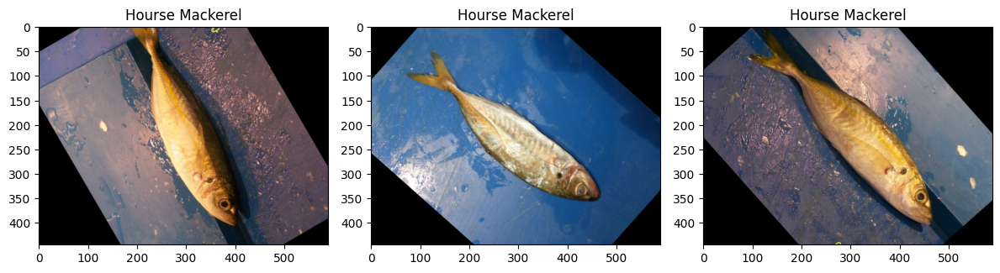

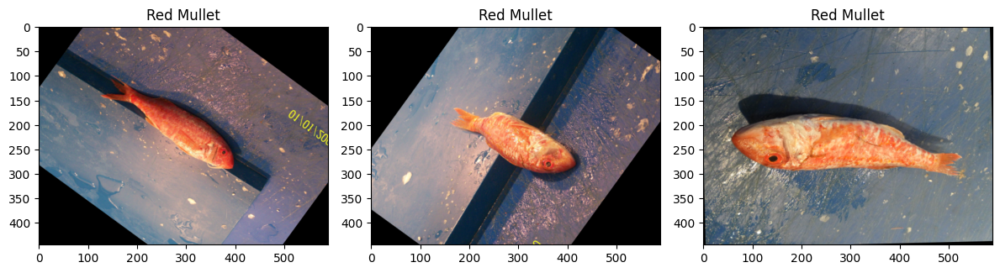

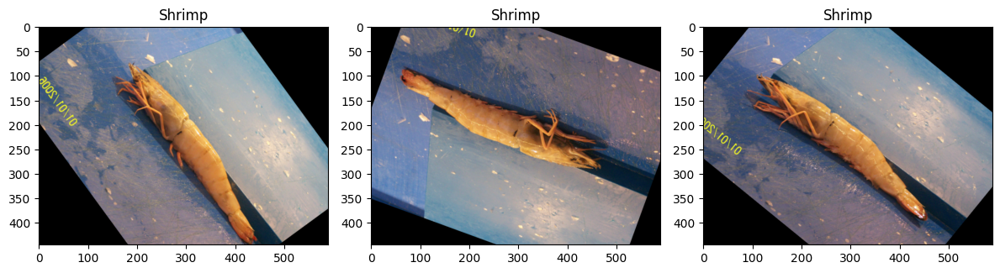

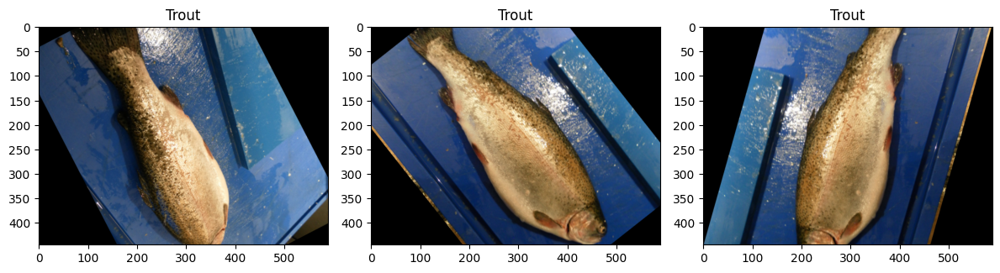

In [6]:
# Define a function to plot images for a specific label
def plot_images_per_label(df, label, cols: int, size: tuple):
    # Create a figure with subplots
    fig, axs = plt.subplots(nrows=1, ncols=cols, figsize=size)

    # Set a maximum count of images to display per label
    cntMax = cols
    cntCur = 0

    # Iterate through the DataFrame rows
    for index, row in df.iterrows():
        # Check if the label matches the specified label and the current count is less than the maximum
        if (row['Labels'] == label and cntCur < cntMax):
            # Display the image
            axs[cntCur].imshow(plt.imread(df.FilePaths[index]))
            axs[cntCur].set_title(df.Labels[index])

            # Increment the current count
            cntCur += 1
        else:
            # If the maximum count is reached, exit the loop
            if (cntCur >= cntMax):
                break

    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()

# Get the unique labels in the DataFrame
labels = sorted(df['Labels'].unique())

# Loop through the unique labels and plot images for each label
for label in labels:
    plot_images_per_label(df, label, 3, (12, 9))


# Train Test Split

In [7]:
# 10% of the data will be used for testing

training_df,testing_df=train_test_split(df,test_size=0.1,shuffle=True,random_state=1)

print('The dimension of training data :',training_df.shape)
print('The dimension of testing data :',testing_df.shape)

The dimension of training data : (3600, 2)
The dimension of testing data : (400, 2)


In [8]:
# Create an ImageDataGenerator for training data with VGG16 preprocessing
training_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.vgg16.preprocess_input,  # Preprocessing function for VGG16
    validation_split=0.2,  # Split 20% of the remeaning data for validation
)

# Create an ImageDataGenerator for testing data with VGG16 preprocessing
testing_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.vgg16.preprocess_input  # Preprocessing function for VGG16
)


In [9]:
# Control Training
_epochs=10
_batch_size=256

In [10]:
training_images=training_generator.flow_from_dataframe(

    dataframe=training_df,
    x_col='FilePaths',
    y_col='Labels',
    class_mode='categorical',
    target_size=(224, 224),
    color_mode='rgb',
    batch_size=_batch_size,
    shuffle=True,
    seed=42,
    subset='training'

)

validation_images=training_generator.flow_from_dataframe(


    dataframe=training_df,
    x_col='FilePaths',
    y_col='Labels',
    class_mode='categorical',
    target_size=(224,224),
    color_mode='rgb',
    batch_size=_batch_size,
    shuffle=True,
    seed=42,
    subset='validation'

)

testing_images=testing_generator.flow_from_dataframe(


    dataframe=testing_df,
    x_col='FilePaths',
    y_col='Labels',
    class_mode='categorical',
    target_size=(224,224),
    color_mode='rgb',
    batch_size=_batch_size,
    shuffle=False, # Do not shuffle the data for testing
)


Found 2880 validated image filenames belonging to 4 classes.
Found 720 validated image filenames belonging to 4 classes.
Found 400 validated image filenames belonging to 4 classes.


# Model Arch.

In [11]:
# Create a pre-trained VGG16 model
pretrained_model = VGG16(
    input_shape=(224, 224, 3),  # Input image shape (224x224 pixels with 3 color channels)
    include_top=False,          # Exclude the fully connected layers (top)
    weights='imagenet',         # Use pre-trained weights from ImageNet
    pooling='avg'               # Use global average pooling as the final layer
)

# Freeze the layers of the pre-trained model
pretrained_model.trainable = False


58889256/58889256 [==============================] - 2s 0us/step


In [12]:
inputs=pretrained_model.input

x=Dense(128,activation='relu')(pretrained_model.output)

x=Dense(128,activation='relu')(x)

x=Dropout(rate=0.3)(x)

x=BatchNormalization()(x)

x=Dense(64,activation='relu')(x)

outputs=Dense(4,activation='softmax')(x)

# Create the final custom model by specifying the input and output layers
model=Model(inputs=inputs, outputs=outputs)

In [13]:
# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display the model summary
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

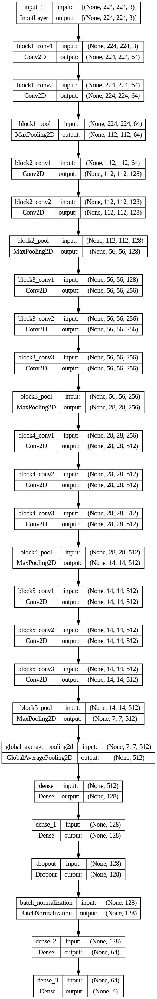

In [14]:
plot_model(model, show_shapes=True) # Model Arch.

# Model Training

In [15]:
# Define the path to the saved checkpoint , early stop condition , reduce lr condition
checkpoint_path = '/content/drive/MyDrive/A Large Scale Fish Dataset/Models/Fish_Classification_VGG16.h5'

early_stopping=EarlyStopping(monitor='val_accuracy',patience=3,verbose=1, mode='max', restore_best_weights=True)

reduce_lr=ReduceLROnPlateau(monitor='val_loss',patience=2,verbose=0,factor=0.1)

model_check_point=ModelCheckpoint(checkpoint_path, monitor='val_accuracy', save_best_only=True, mode='max',verbose=True)

In [16]:
history=model.fit(

    training_images,
    validation_data=validation_images,
    epochs=_epochs,
    batch_size=_batch_size,
    verbose=1,
    callbacks=[early_stopping,reduce_lr,model_check_point]

)

Epoch 1/10
12/12 [==============================] - ETA: 0s - loss: 0.6404 - accuracy: 0.7785  
Epoch 1: val_accuracy improved from -inf to 0.95556, saving model to /content/drive/MyDrive/A Large Scale Fish Dataset/Models/Fish_Classification_VGG16.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


12/12 [==============================] - 1172s 95s/step - loss: 0.6404 - accuracy: 0.7785 - val_loss: 0.1177 - val_accuracy: 0.9556 - lr: 0.0010
Epoch 2/10
12/12 [==============================] - ETA: 0s - loss: 0.0631 - accuracy: 0.9986
Epoch 2: val_accuracy improved from 0.95556 to 0.99722, saving model to /content/drive/MyDrive/A Large Scale Fish Dataset/Models/Fish_Classification_VGG16.h5
12/12 [==============================] - 51s 4s/step - loss: 0.0631 - accuracy: 0.9986 - val_loss: 0.0063 - val_accuracy: 0.9972 - lr: 0.0010
Epoch 3/10
12/12 [==============================] - ETA: 0s - loss: 0.0145 - accuracy: 1.0000
Epoch 3: val_accuracy improved from 0.99722 to 1.00000, saving model to /content/drive/MyDrive/A Large Scale Fish Dataset/Models/Fish_Classification_VGG16.h5
12/12 [==============================] - 50s 4s/step - loss: 0.0145 - accuracy: 1.0000 - val_loss: 0.0022 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 4/10
12/12 [==============================] - ETA: 0s - loss:

# Results

In [17]:
# Model Improvments through Epochs
history_df=pd.DataFrame(history.history)
history_df

,loss,accuracy,val_loss,val_accuracy,lr
0,0.640419,0.778472,0.117738,0.955556,0.001
1,0.063113,0.998611,0.006271,0.997222,0.001
2,0.014473,1.000000,0.002243,1.000000,0.001
3,0.005967,1.000000,0.000828,1.000000,0.001
4,0.003733,1.000000,0.000517,1.000000,0.001
5,0.002826,1.000000,0.000374,1.000000,0.001


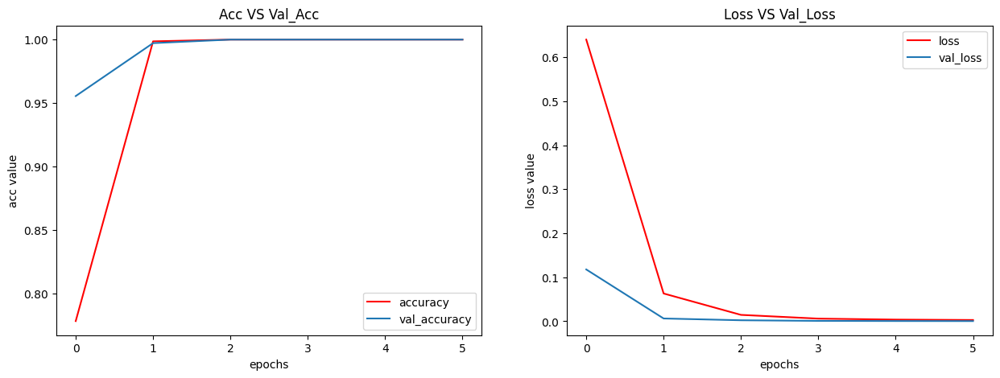

In [18]:
plt.figure(figsize=(15,5))

# plotting accuracy and val_accuracy
plt.subplot(1,2,1)
plt.plot(history_df['accuracy'],label='accuracy',c='red')
plt.plot(history_df['val_accuracy'],label='val_accuracy')
plt.xlabel('epochs')
plt.ylabel('acc value')
plt.title('Acc VS Val_Acc')
plt.legend()
# plotting loss and val_loss
plt.subplot(1,2,2)
plt.plot(history_df['loss'],label='loss',c='red')
plt.plot(history_df['val_loss'],label='val_loss')
plt.title('Loss VS Val_Loss')
plt.xlabel('epochs')
plt.ylabel('loss value')
plt.legend()

plt.show()

* ***Load & Test Best Saved Model***

In [19]:
# Load The Best Model Weights

from keras.models import load_model

model=load_model('/content/drive/MyDrive/A Large Scale Fish Dataset/Models/Fish_Classification_VGG16.h5')

In [20]:
# Evaluate on Test Set

Evaluation=model.evaluate(testing_images)


print("Test Accuracy: {:.2f}%".format(Evaluation[1] * 100))
print("Test Loss: {:.5f}".format(Evaluation[0]))

2/2 [==============================] - 74s 69s/step - loss: 3.8662e-04 - accuracy: 1.0000
Test Accuracy: 100.00%
Test Loss: 0.00039


In [21]:
# predicted labels
Y_pred = model.predict(testing_images)
print("Y_pred", Y_pred.shape)
# rounded labels
y_pred = np.argmax(Y_pred, axis=1)
print("y_pred", y_pred.size)

2/2 [==============================] - 6s 2s/step
Y_pred (400, 4)
y_pred 400


In [22]:
# true labels
y_true = testing_images.classes
print("y_pred", len(y_pred))
# label classes
class_labels = list(testing_images.class_indices.keys())
print("labels", len(class_labels))

y_pred 400
labels 4


* ***Confusion Matrix***

[[Text(0.5, 0, 'Hourse Mackerel'),
  Text(1.5, 0, 'Red Mullet'),
  Text(2.5, 0, 'Shrimp'),
  Text(3.5, 0, 'Trout')],
 [Text(0, 0.5, 'Hourse Mackerel'),
  Text(0, 1.5, 'Red Mullet'),
  Text(0, 2.5, 'Shrimp'),
  Text(0, 3.5, 'Trout')]]

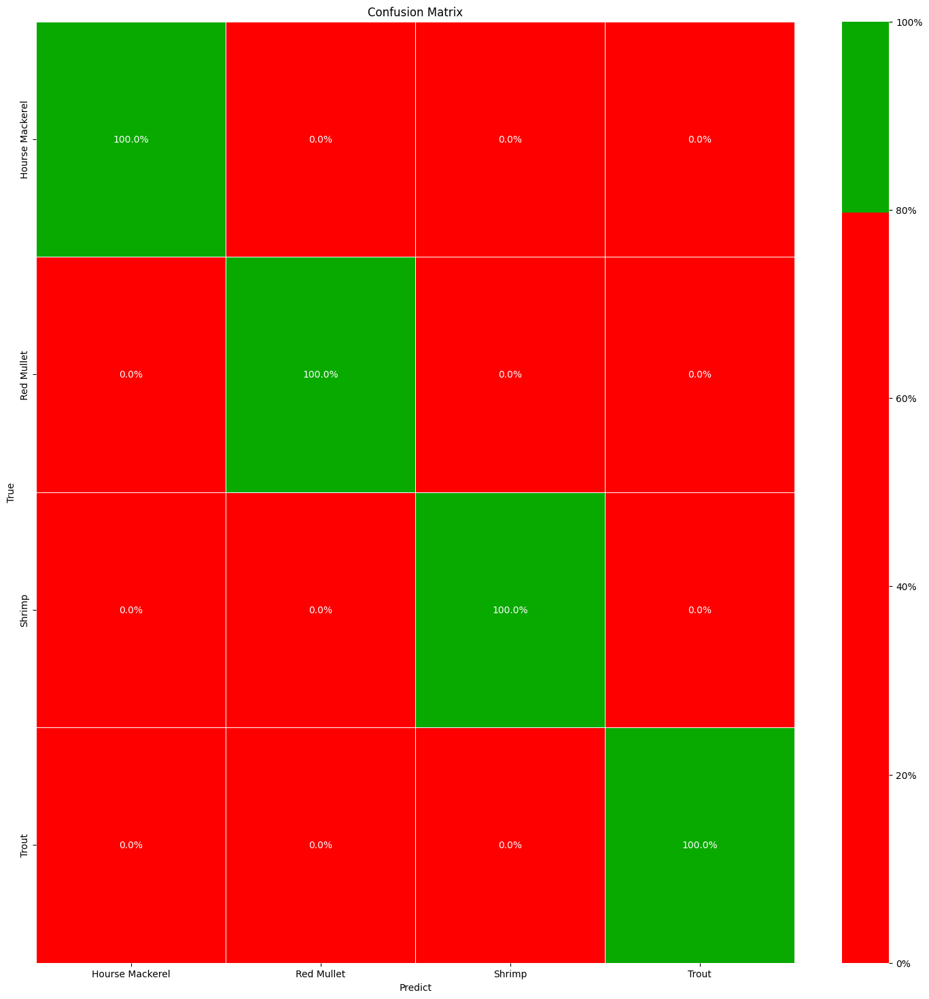

In [23]:
# compare with true labels
cfm = confusion_matrix(y_pred, y_true, normalize='true')

# plot size
fig, ax = plt.subplots(figsize=(18,18))
# print confusion matrix
s = sb.heatmap(cfm,
                annot=True,
                cmap=['#ff0000', '#09AA00'],
                center=0.8,
                fmt='.1%',
                linewidths=.5,
                cbar_kws={'format': FuncFormatter(lambda x, pos: '{:.0%}'.format(x))}, #'label': 'Percentage'
                linecolor='white',
                ax=ax)
# set labels
s.set(xlabel='Predict', ylabel='True')
s.set(title='Confusion Matrix')
s.set(xticklabels=class_labels, yticklabels=class_labels)

* ***Test Sampels Actual Vs. Predicted***

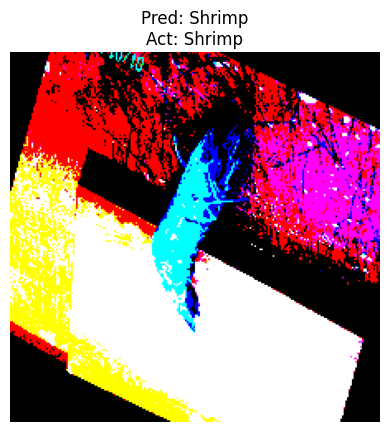

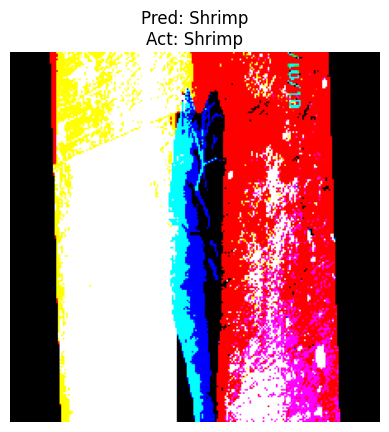

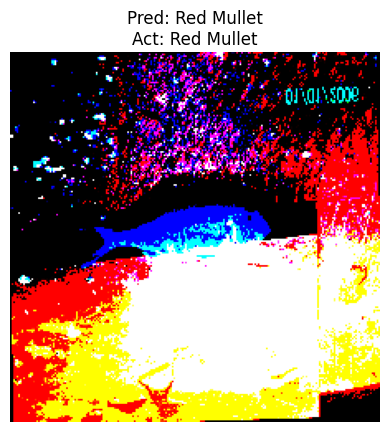

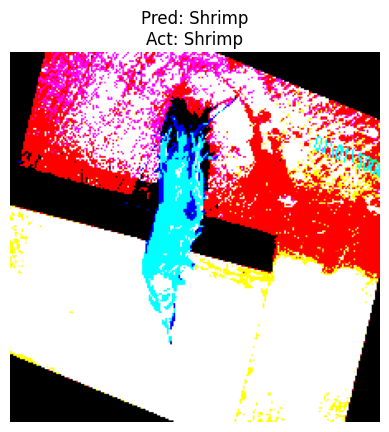

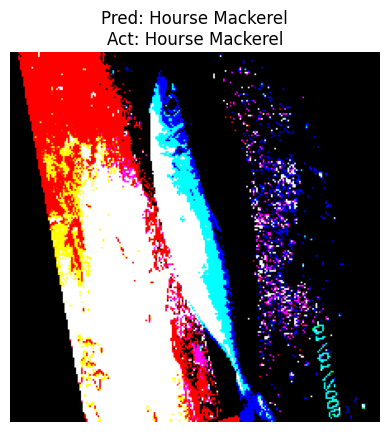

...

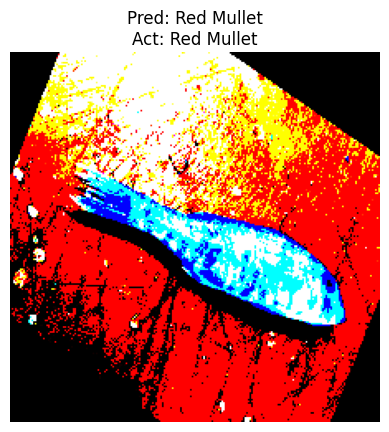

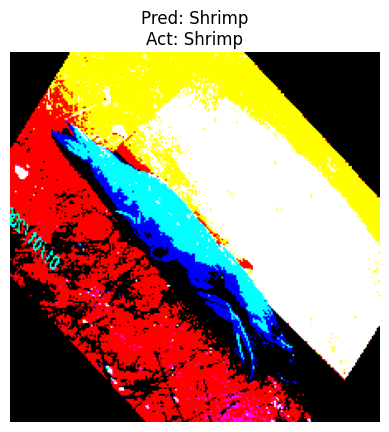

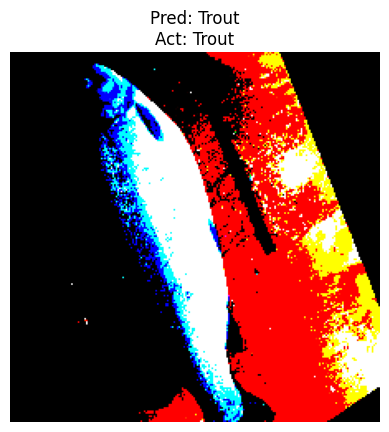

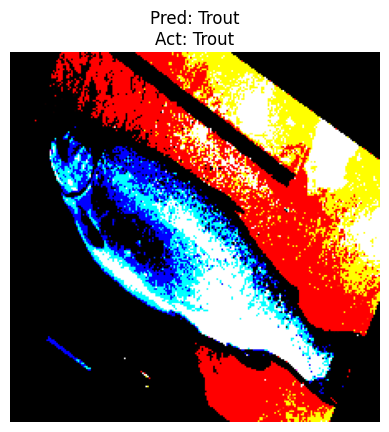

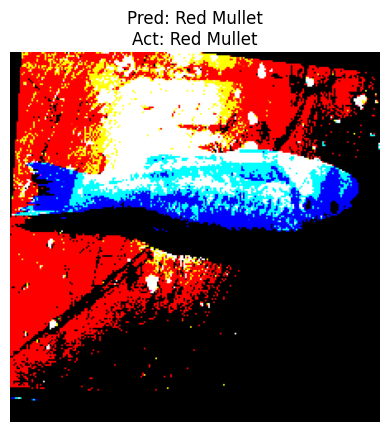

In [30]:
def show_images_with_labels(images, true_labels, predicted_labels, class_labels, num_images):
    # Get the number of available images
    num_available_images = len(images)

    # Generate random indices within the valid range
    random_indices = np.random.choice(num_available_images, num_images, replace=False)

    # Display the images with their predicted and actual labels
    for index in random_indices:
        image = images[index]
        actual_label = class_labels[true_labels[index]]
        predicted_label = class_labels[predicted_labels[index]]

        plt.imshow(image)
        plt.title(f"Pred: {predicted_label}\nAct: {actual_label}")
        plt.axis('off')
        plt.show()

show_images_with_labels(testing_images[0][0], y_true, y_pred, class_labels, num_images=100)
